In [ ]:

import os, glob, math
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import (
    Input, Conv2D, BatchNormalization, ReLU, Subtract, Concatenate,
    MaxPooling2D, SeparableConv2D, AveragePooling2D, Add,
    GlobalAveragePooling2D, Reshape, Conv2DTranspose, UpSampling2D
)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback

def tile_image(img, tile_size=512, overlap=64):
    H, W = img.shape[:2]
    step = tile_size - overlap
    tiles = []
    coords = []
    for y in range(0, H - tile_size + 1, step):
        for x in range(0, W - tile_size + 1, step):
            tiles.append(img[y:y+tile_size, x:x+tile_size])
            coords.append((y,x))
    return tiles, coords

def load_and_tile_dataset(base_dir, split="train", tile_size=512, overlap=64):
    A_paths = sorted(glob.glob(os.path.join(base_dir, split, "A", "*.png")))
    B_paths = sorted(glob.glob(os.path.join(base_dir, split, "B", "*.png")))
    L_paths = sorted(glob.glob(os.path.join(base_dir, split, "label", "*.png")))

    X1_tiles, X2_tiles, Y_tiles = [], [], []
    for pA, pB, pL in zip(A_paths, B_paths, L_paths):
        A = cv2.cvtColor(cv2.imread(pA, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB).astype(np.float32)/255.0
        B = cv2.cvtColor(cv2.imread(pB, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB).astype(np.float32)/255.0
        L = cv2.imread(pL, cv2.IMREAD_GRAYSCALE) 
        a_tiles, _ = tile_image(A, tile_size=tile_size, overlap=overlap)
        b_tiles, _ = tile_image(B, tile_size=tile_size, overlap=overlap)
        l_tiles, _ = tile_image(L, tile_size=tile_size, overlap=overlap)

        for at, bt, lt in zip(a_tiles, b_tiles, l_tiles):
            mask = (lt > 127).astype(np.uint8)
            onehot = np.zeros((tile_size, tile_size, 2), dtype=np.float32)
            onehot[...,0] = (mask == 0)
            onehot[...,1] = (mask == 1)

            X1_tiles.append(at)
            X2_tiles.append(bt)
            Y_tiles.append(onehot)

    X1 = np.stack(X1_tiles, axis=0).astype(np.float32)
    X2 = np.stack(X2_tiles, axis=0).astype(np.float32)
    Y  = np.stack(Y_tiles, axis=0).astype(np.float32)
    return X1, X2, Y

base_dir = r"D:/SujanD datasets/datasets/mdrifaturrahman33/levir-cd/versions/1/LEVIR CD"

X1_train, X2_train, y_train = load_and_tile_dataset(base_dir, "train", tile_size=512, overlap=64)
X1_val, X2_val, y_val       = load_and_tile_dataset(base_dir, "val", tile_size=512, overlap=64)
X1_test, X2_test, y_test    = load_and_tile_dataset(base_dir, "test", tile_size=512, overlap=64)

print("Train tiles:", X1_train.shape, y_train.shape)
print("Val tiles:  ", X1_val.shape, y_val.shape)
print("Test tiles: ", X1_test.shape, y_test.shape)


def poolblock(x, s, filters):
    b1 = SeparableConv2D(filters, (3,3), strides=(s,s), padding='same')(x)
    b2 = AveragePooling2D(pool_size=(s,s), strides=(s,s), padding='same')(x)
    b2 = Conv2D(filters, (1,1), padding='same')(b2)
    return Add()([b1, b2])

def globalpoolblock_transpose(x, target_shape):
    c = K.int_shape(x)[-1]
    pooled = GlobalAveragePooling2D()(x)
    pooled = Reshape((1,1,c))(pooled)
    pooled = Conv2D(c, (1,1), padding='same')(pooled)
    pooled = Conv2DTranspose(c, kernel_size=(target_shape[0], target_shape[1]),
                             strides=(target_shape[0], target_shape[1]), padding='same')(pooled)
    return pooled

def NSPP(x):
    h, w, c = K.int_shape(x)[1:]
    c_ = max(1, c//4)
    out1 = poolblock(x, s=max(1, h//2), filters=c_)
    out1 = globalpoolblock_transpose(out1, (h,w))
    out2 = poolblock(x, s=max(1, h//4), filters=c_)
    out2 = globalpoolblock_transpose(out2, (h,w))
    out3 = poolblock(x, s=max(1, h//8), filters=c_)
    out3 = globalpoolblock_transpose(out3, (h,w))
    out4 = poolblock(x, s=max(1, h//16), filters=c_)
    out4 = globalpoolblock_transpose(out4, (h,w))
    concat = Concatenate()([x, out1, out2, out3, out4])
    return Conv2D(c, (1,1), padding='same')(concat)

def build_ucdnet(input_shape=(512,512,3)):
    t1 = Input(shape=input_shape); t2 = Input(shape=input_shape)

    sconv1 = Conv2D(16,(3,3),padding='same')
    sbn1 = BatchNormalization(); srelu1 = ReLU()
    I1X1 = srelu1(sbn1(sconv1(t1))); I2X1 = srelu1(sbn1(sconv1(t2)))
    diff1 = Subtract()([I1X1,I2X1]); purple1 = ReLU()(Conv2D(16,(1,1),padding='same')(diff1))
    sconv2 = Conv2D(16,(3,3),padding='same'); sbn2 = BatchNormalization(); srelu2 = ReLU()
    I1X2 = srelu2(sbn2(sconv2(I1X1))); I2X2 = srelu2(sbn2(sconv2(I2X1)))
    I1S1C1 = Concatenate()([I1X2, purple1]); I2S1C1 = Concatenate()([I2X2, purple1])
    I1S1P1 = MaxPooling2D((2,2))(I1S1C1); I2S1P1 = MaxPooling2D((2,2))(I2S1C1)

    sconv3 = Conv2D(32,(3,3),padding='same'); sbn3 = BatchNormalization(); srelu3 = ReLU()
    I1S2X1 = srelu3(sbn3(sconv3(I1S1P1))); I2S2X1 = srelu3(sbn3(sconv3(I2S1P1)))
    diff2 = Subtract()([I1S2X1,I2S2X1]); purple2 = ReLU()(Conv2D(32,(1,1),padding='same')(diff2))
    sconv4 = Conv2D(32,(3,3),padding='same'); sbn4 = BatchNormalization(); srelu4=ReLU()
    I1S2X2 = srelu4(sbn4(sconv4(I1S2X1))); I2S2X2 = srelu4(sbn4(sconv4(I2S2X1)))
    I1S2C1 = Concatenate()([I1S2X2,purple2]); I2S2C1 = Concatenate()([I2S2X2,purple2])
    I1S2P2 = MaxPooling2D((2,2))(I1S2C1); I2S2P2 = MaxPooling2D((2,2))(I2S2C1)

    sconv5 = Conv2D(64,(3,3),padding='same'); sbn5 = BatchNormalization(); srelu5=ReLU()
    I1S3X1 = srelu5(sbn5(sconv5(I1S2P2))); I2S3X1 = srelu5(sbn5(sconv5(I2S2P2)))
    diff3 = Subtract()([I1S3X1,I2S3X1]); purple3 = ReLU()(Conv2D(64,(1,1),padding='same')(diff3))
    sconv6 = Conv2D(64,(3,3),padding='same'); sbn6 = BatchNormalization(); srelu6=ReLU()
    I1S3X2 = srelu6(sbn6(sconv6(I1S3X1))); I2S3X2 = srelu6(sbn6(sconv6(I2S3X1)))
    I1S3C1 = Concatenate()([I1S3X2,purple3]); I2S3C1 = Concatenate()([I2S3X2,purple3])
    I1S3P3 = MaxPooling2D((2,2))(I1S3C1); I2S3P3 = MaxPooling2D((2,2))(I2S3C1)

    sconv7 = Conv2D(128,(3,3),padding='same'); sbn7 = BatchNormalization(); srelu7=ReLU()
    I1S4X1 = srelu7(sbn7(sconv7(I1S3P3))); I2S4X1 = srelu7(sbn7(sconv7(I2S3P3)))
    diff4 = Subtract()([I1S4X1,I2S4X1]); purple4 = ReLU()(Conv2D(128,(1,1),padding='same')(diff4))
    sconv8 = Conv2D(128,(3,3),padding='same'); sbn8 = BatchNormalization(); srelu8=ReLU()
    I1S4X2 = srelu8(sbn8(sconv8(I1S4X1))); I2S4X2 = srelu8(sbn8(sconv8(I2S4X1)))
    I1S4C1 = Concatenate()([I1S4X2,purple4]); I2S4C1 = Concatenate()([I2S4X2,purple4])
    sconv9 = Conv2D(64,(3,3),padding='same'); sbn9=BatchNormalization(); srelu9=ReLU()
    I1S4X3 = srelu9(sbn9(sconv9(I1S4C1))); I2S4X3 = srelu9(sbn9(sconv9(I2S4C1)))
    diff5 = Subtract()([I1S4X3,I2S4X3])
    ImageCon3 = Concatenate()([diff5, I1S4X3, I2S4X3])

    nspp_out = NSPP(ImageCon3)
    x = Conv2D(64,(3,3),padding='same')(nspp_out); x = ReLU()(x); x = BatchNormalization()(x)
    x = UpSampling2D((2,2), interpolation='bilinear')(x)
    x = Concatenate()([x, I1S3C1, I2S3C1])
    x = Conv2D(64,(3,3),padding='same')(x); x = ReLU()(x)
    x = Conv2D(64,(3,3),padding='same')(x); x = ReLU()(x)
    x = Conv2D(64,(3,3),padding='same')(x); x = ReLU()(x)
    x = BatchNormalization()(x)

    x = UpSampling2D((2,2), interpolation='bilinear')(x)
    x = Concatenate()([x, I1S2C1, I2S2C1])
    x = Conv2D(32,(3,3),padding='same')(x); x = ReLU()(x)
    x = Conv2D(32,(3,3),padding='same')(x); x = ReLU()(x)
    x = BatchNormalization()(x)

    x = UpSampling2D((2,2), interpolation='bilinear')(x)
    x = Concatenate()([x, I1S1C1, I2S1C1])
    x = Conv2D(16,(3,3),padding='same')(x); x = ReLU()(x)
    x = BatchNormalization()(x)

    finalout = Conv2D(2,(1,1), padding='same', activation='softmax')(x)
    model = Model(inputs=[t1,t2], outputs=finalout)
    return model

model = build_ucdnet((512,512,3))
model.summary()


def weighted_categorical_crossentropy_mean(y_true, y_pred, class_weights):
    y_pred = tf.clip_by_value(y_pred, K.epsilon(), 1.0 - K.epsilon())
    ce = -tf.reduce_sum(y_true * tf.math.log(y_pred) * class_weights, axis=-1)  
    return tf.reduce_mean(ce)

def modified_kappa(y_true, y_pred):
    y_true_f = tf.reshape(y_true, [-1, tf.shape(y_true)[-1]])
    y_pred_f = tf.reshape(y_pred, [-1, tf.shape(y_pred)[-1]])

    y_pos = y_true_f[:,1]; y_neg = y_true_f[:,0]
    p_pos = y_pred_f[:,1]; p_neg = y_pred_f[:,0]

    TP = tf.reduce_sum(y_pos * p_pos)
    FP = tf.reduce_sum(y_neg * p_pos)
    FN = tf.reduce_sum(y_pos * p_neg)
    TN = tf.reduce_sum(y_neg * p_neg)

    total = TP + FP + FN + TN + 1e-7
    p0 = (TP + TN) / total

    row_pos = (TP + FP) / total
    row_neg = (FN + TN) / total
    col_pos = (TP + FN) / total
    col_neg = (FP + TN) / total
    pe = row_pos * col_pos + row_neg * col_neg

    kappa = (p0 - pe) / (1 - pe + 1e-7)
    Lk = 1.0 - kappa
    return kappa, Lk

def log_cosh(x):
    return tf.math.log((tf.exp(x) + tf.exp(-x)) / 2.0 + 1e-12)

def paper_loss_fn(class_weights=tf.constant([0.5, 2.5], dtype=tf.float32)):
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32); y_pred = tf.cast(y_pred, tf.float32)
        wcce = weighted_categorical_crossentropy_mean(y_true, y_pred, class_weights)
        _, Lk = modified_kappa(y_true, y_pred)
        return wcce + log_cosh(Lk)
    return loss

from sklearn.metrics import precision_score, recall_score, f1_score, jaccard_score, cohen_kappa_score

class ValMetrics(Callback):
    def __init__(self, val_data):
        super().__init__()
        self.X1_val, self.X2_val, self.y_val = val_data

    def on_epoch_end(self, epoch, logs=None):
        preds = self.model.predict([self.X1_val, self.X2_val], verbose=0)
        y_true = self.y_val[...,1].reshape(-1)
        y_pred = (preds[...,1] > 0.5).astype(np.uint8).reshape(-1)

        prec = precision_score(y_true, y_pred, zero_division=0)
        rec  = recall_score(y_true, y_pred, zero_division=0)
        f1   = f1_score(y_true, y_pred, zero_division=0)
        iou  = jaccard_score(y_true, y_pred, zero_division=0)
        kappa= cohen_kappa_score(y_true, y_pred)

        print(f" — val_prec: {prec:.4f} val_rec: {rec:.4f} val_f1: {f1:.4f} val_iou: {iou:.4f} val_kappa: {kappa:.4f}")


class_weights = tf.constant([0.5, 2.5], dtype=tf.float32)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

model.compile(optimizer=optimizer, loss=paper_loss_fn(class_weights), metrics=['accuracy'])

checkpoint = ModelCheckpoint("UCDNet_paper_best.h5", monitor="val_loss", save_best_only=True, verbose=1)
earlystop  = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)
reduce_lr  = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, verbose=1, min_lr=1e-6)

val_metrics_cb = ValMetrics((X1_val, X2_val, y_val))

history = model.fit(
    x=[X1_train, X2_train], y=y_train,
    validation_data=([X1_val, X2_val], y_val),
    batch_size=1, epochs=30,
    callbacks=[checkpoint, earlystop, reduce_lr, val_metrics_cb],
    shuffle=True, verbose=1
)

preds_test = model.predict([X1_test, X2_test], verbose=1)
y_true_test = y_test[...,1].reshape(-1)
y_pred_test = (preds_test[...,1] > 0.5).astype(np.uint8).reshape(-1)

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score, cohen_kappa_score
print("Test Acc  :", accuracy_score(y_true_test, y_pred_test))
print("Test Prec :", precision_score(y_true_test, y_pred_test, zero_division=0))
print("Test Rec  :", recall_score(y_true_test, y_pred_test, zero_division=0))
print("Test F1   :", f1_score(y_true_test, y_pred_test, zero_division=0))
print("Test IoU  :", jaccard_score(y_true_test, y_pred_test, zero_division=0))
print("Test Kappa:", cohen_kappa_score(y_true_test, y_pred_test))


C:\Users\NITK\anaconda3\envs\Shyam_Lal\lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


Train tiles: (1780, 512, 512, 3) (1780, 512, 512, 2)
Val tiles:   (256, 512, 512, 3) (256, 512, 512, 2)
Test tiles:  (512, 512, 512, 3) (512, 512, 512, 2)
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 512, 512, 16) 448         input_1[0][0]                    
                                                                 input_2[0][0]                    
______________________________________

C:\Users\NITK\anaconda3\envs\Shyam_Lal\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


 — val_prec: 0.4258 val_rec: 0.8275 val_f1: 0.5623 val_iou: 0.3911 val_kappa: 0.5371
Epoch 2/30
1780/1780 [==============================] - 223s 125ms/step - loss: 0.3801 - accuracy: 0.9723 - val_loss: 0.3445 - val_accuracy: 0.9785

Epoch 00002: val_loss improved from 0.51304 to 0.34449, saving model to UCDNet_paper_best.h5


C:\Users\NITK\anaconda3\envs\Shyam_Lal\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


 — val_prec: 0.7009 val_rec: 0.8338 val_f1: 0.7616 val_iou: 0.6150 val_kappa: 0.7504
Epoch 3/30
1780/1780 [==============================] - 222s 125ms/step - loss: 0.2945 - accuracy: 0.9801 - val_loss: 0.3072 - val_accuracy: 0.9776

Epoch 00003: val_loss improved from 0.34449 to 0.30716, saving model to UCDNet_paper_best.h5


C:\Users\NITK\anaconda3\envs\Shyam_Lal\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


 — val_prec: 0.6869 val_rec: 0.8364 val_f1: 0.7543 val_iou: 0.6055 val_kappa: 0.7427
Epoch 4/30
1780/1780 [==============================] - 223s 125ms/step - loss: 0.2539 - accuracy: 0.9827 - val_loss: 0.3380 - val_accuracy: 0.9801

Epoch 00004: val_loss did not improve from 0.30716
 — val_prec: 0.8026 val_rec: 0.6860 val_f1: 0.7397 val_iou: 0.5870 val_kappa: 0.7295
Epoch 5/30
1780/1780 [==============================] - 223s 125ms/step - loss: 0.2316 - accuracy: 0.9843 - val_loss: 0.3354 - val_accuracy: 0.9828

Epoch 00005: val_loss did not improve from 0.30716
 — val_prec: 0.8859 val_rec: 0.6676 val_f1: 0.7614 val_iou: 0.6147 val_kappa: 0.7526
Epoch 6/30
1780/1780 [==============================] - 224s 126ms/step - loss: 0.2163 - accuracy: 0.9856 - val_loss: 0.3848 - val_accuracy: 0.9799

Epoch 00006: val_loss did not improve from 0.30716
 — val_prec: 0.8831 val_rec: 0.5890 val_f1: 0.7067 val_iou: 0.5464 val_kappa: 0.6967
Epoch 7/30
1780/1780 [==============================] - 223s

C:\Users\NITK\anaconda3\envs\Shyam_Lal\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


 — val_prec: 0.7816 val_rec: 0.8595 val_f1: 0.8187 val_iou: 0.6930 val_kappa: 0.8105
Epoch 9/30
1780/1780 [==============================] - 222s 125ms/step - loss: 0.1996 - accuracy: 0.9869 - val_loss: 0.3440 - val_accuracy: 0.9825

Epoch 00009: val_loss did not improve from 0.26046
 — val_prec: 0.9013 val_rec: 0.6465 val_f1: 0.7529 val_iou: 0.6037 val_kappa: 0.7441
Epoch 10/30
1780/1780 [==============================] - 222s 124ms/step - loss: 0.1877 - accuracy: 0.9885 - val_loss: 0.2984 - val_accuracy: 0.9840

Epoch 00010: val_loss did not improve from 0.26046
 — val_prec: 0.8200 val_rec: 0.7832 val_f1: 0.8012 val_iou: 0.6683 val_kappa: 0.7928
Epoch 11/30
1780/1780 [==============================] - 222s 124ms/step - loss: 0.1950 - accuracy: 0.9872 - val_loss: 0.3304 - val_accuracy: 0.9842

Epoch 00011: val_loss did not improve from 0.26046
 — val_prec: 0.8989 val_rec: 0.6953 val_f1: 0.7841 val_iou: 0.6449 val_kappa: 0.7761
Epoch 12/30
1780/1780 [==============================] - 2

In [2]:
preds_test = model.predict([X1_test, X2_test], verbose=1)
y_true_test = y_test[...,1].reshape(-1)
y_pred_test = (preds_test[...,1] > 0.6).astype(np.uint8).reshape(-1)

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score, cohen_kappa_score
print("Test Acc  :", accuracy_score(y_true_test, y_pred_test))
print("Test Prec :", precision_score(y_true_test, y_pred_test, zero_division=0))
print("Test Rec  :", recall_score(y_true_test, y_pred_test, zero_division=0))
print("Test F1   :", f1_score(y_true_test, y_pred_test, zero_division=0))
print("Test IoU  :", jaccard_score(y_true_test, y_pred_test, zero_division=0))
print("Test Kappa:", cohen_kappa_score(y_true_test, y_pred_test))

16/16 [==============================] - 11s 691ms/step
Test Acc  : 0.9800355657935143
Test Prec : 0.7930530398634366
Test Rec  : 0.8212439869378262
Test F1   : 0.806902359971691
Test IoU  : 0.6763087386146747
Test Kappa: 0.7963793648944766


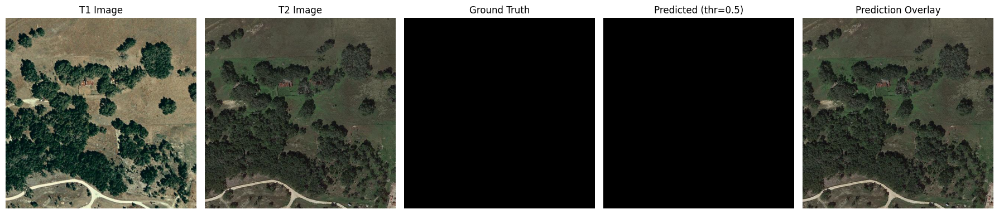

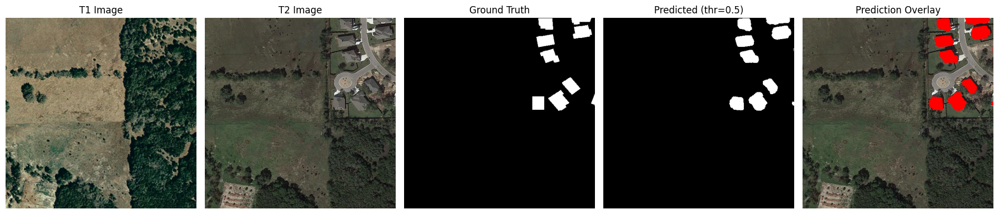

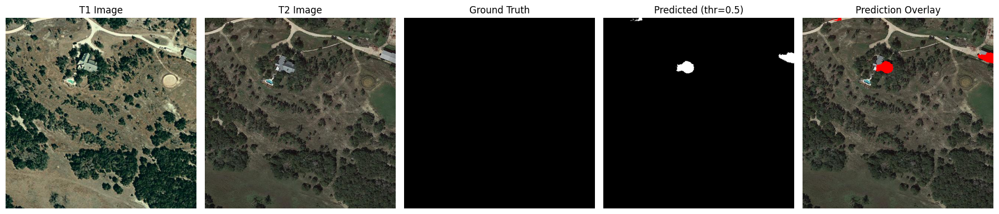

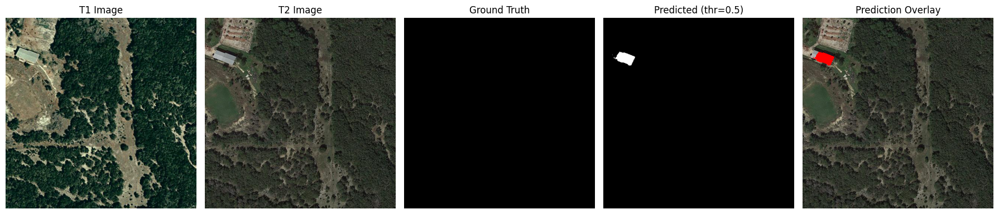

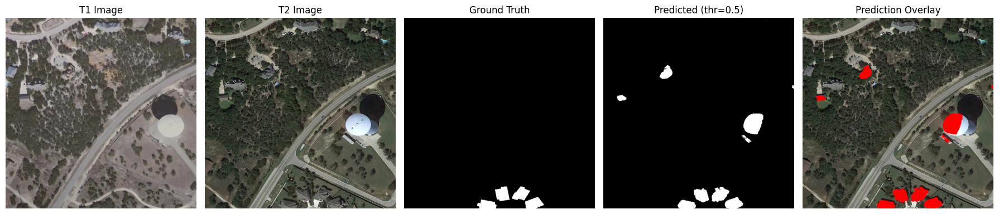

In [ ]:
import matplotlib.pyplot as plt

def visualize_predictions(model, X1, X2, y_true, num_samples=5, threshold=0.5):
    """
    Show sample predictions from change detection model.
    """
    preds = model.predict([X1, X2], verbose=0)
    preds_bin = (preds[..., 1] > threshold).astype(np.uint8) 
    for i in range(num_samples):
        fig, axs = plt.subplots(1, 5, figsize=(18, 6))

        axs[0].imshow(X1[i])
        axs[0].set_title("T1 Image")
        axs[0].axis("off")

        axs[1].imshow(X2[i])
        axs[1].set_title("T2 Image")
        axs[1].axis("off")

        axs[2].imshow(y_true[i, ..., 1], cmap="gray")
        axs[2].set_title("Ground Truth")
        axs[2].axis("off")

        axs[3].imshow(preds_bin[i], cmap="gray")
        axs[3].set_title(f"Predicted (thr={threshold})")
        axs[3].axis("off")

        overlay = X2[i].copy()
        overlay[preds_bin[i] == 1] = [1.0, 0, 0] 
        axs[4].imshow(overlay)
        axs[4].set_title("Prediction Overlay")
        axs[4].axis("off")

        plt.tight_layout()
        plt.show()

visualize_predictions(model, X1_test, X2_test, y_test, num_samples=5, threshold=0.5)


In [ ]:
import numpy as np

print("Unique values in y_train before one-hot:", np.unique(y_train))
print("Unique values in y_val before one-hot:", np.unique(y_val))

print("T1 train min/max:", X1_train.min(), X1_train.max())
print("T2 train min/max:", X2_train.min(), X2_train.max())




Unique values in y_train before one-hot: [0. 1.]
Unique values in y_val before one-hot: [0. 1.]
T1 train min/max: 0.0 1.0
T2 train min/max: 0.0 1.0


In [ ]:
import tensorflow as tf
from tensorflow.keras import backend as K

def weighted_categorical_crossentropy(y_true, y_pred, class_weights):
    y_pred = tf.clip_by_value(y_pred, K.epsilon(), 1.0 - K.epsilon())
    ce = -tf.reduce_sum(y_true * tf.math.log(y_pred) * class_weights, axis=-1)
    return ce 

def modified_kappa(y_true, y_pred):
    y_true_f = tf.reshape(y_true, [-1, tf.shape(y_true)[-1]])
    y_pred_f = tf.reshape(y_pred, [-1, tf.shape(y_pred)[-1]])

    y_pos, y_neg = y_true_f[:, 1], y_true_f[:, 0]
    p_pos, p_neg = y_pred_f[:, 1], y_pred_f[:, 0]

    TP = tf.reduce_sum(y_pos * p_pos)
    FP = tf.reduce_sum(y_neg * p_pos)
    FN = tf.reduce_sum(y_pos * p_neg)
    TN = tf.reduce_sum(y_neg * p_neg)

    total = TP + FP + FN + TN + 1e-7
    p0 = (TP + TN) / total
    pe = ((TP + FP) / total) * ((TP + FN) / total) + ((FN + TN) / total) * ((FP + TN) / total)
    kappa = (p0 - pe) / (1 - pe + 1e-7)
    return kappa, 1.0 - kappa

def log_cosh(x):
    return tf.math.log((tf.exp(x) + tf.exp(-x)) / 2.0 + 1e-12)

def hybrid_loss_fn(class_weights=tf.constant([0.5, 2.5], dtype=tf.float32), gamma=2.0):
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred, tf.float32)

        wcce = weighted_categorical_crossentropy(y_true, y_pred, class_weights)

        pt = tf.reduce_sum(y_true * y_pred, axis=-1)
        focal_scale = tf.pow(1.0 - pt, gamma)
        wcce_focal = wcce * (1.0 + focal_scale)

        wcce_mean = tf.reduce_mean(wcce_focal)

        _, L_kappa_prime = modified_kappa(y_true, y_pred)
        logcosh_k = log_cosh(L_kappa_prime)

        return wcce_mean + logcosh_k
    return loss


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

class_weights = tf.constant([0.5, 2.5], dtype=tf.float32)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-5),
    loss=hybrid_loss_fn(class_weights=class_weights, gamma=2.0),
    metrics=['accuracy']
)

checkpoint = ModelCheckpoint(
    filepath="UCDNet_best.h5",
    monitor="val_loss",
    save_best_only=True,
    verbose=1
)
earlystop = EarlyStopping(monitor="val_loss", patience=15, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6, verbose=1)

history = model.fit(
    x=[X1_train, X2_train],
    y=y_train,
    validation_data=([X1_val, X2_val], y_val),
    batch_size=1,
    epochs=80,  
    callbacks=[checkpoint, earlystop, reduce_lr],
    verbose=1
)


Epoch 1/80
1780/1780 [==============================] - 233s 129ms/step - loss: 0.2057 - accuracy: 0.9882 - val_loss: 0.4337 - val_accuracy: 0.9827

Epoch 00001: val_loss improved from inf to 0.43367, saving model to UCDNet_best.h5


C:\Users\NITK\anaconda3\envs\Shyam_Lal\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/80
1780/1780 [==============================] - 228s 128ms/step - loss: 0.1971 - accuracy: 0.9891 - val_loss: 0.3712 - val_accuracy: 0.9851

Epoch 00002: val_loss improved from 0.43367 to 0.37123, saving model to UCDNet_best.h5
Epoch 3/80
1780/1780 [==============================] - 225s 127ms/step - loss: 0.1920 - accuracy: 0.9896 - val_loss: 0.3930 - val_accuracy: 0.9848

Epoch 00003: val_loss did not improve from 0.37123
Epoch 4/80
1780/1780 [==============================] - 224s 126ms/step - loss: 0.1872 - accuracy: 0.9900 - val_loss: 0.4491 - val_accuracy: 0.9827

Epoch 00004: val_loss did not improve from 0.37123
Epoch 5/80
1780/1780 [==============================] - 224s 126ms/step - loss: 0.1875 - accuracy: 0.9900 - val_loss: 0.3697 - val_accuracy: 0.9856

Epoch 00005: val_loss improved from 0.37123 to 0.36966, saving model to UCDNet_best.h5
Epoch 6/80
1780/1780 [==============================] - 225s 126ms/step - loss: 0.1816 - accuracy: 0.9906 - val_loss: 0.5019 - v

In [8]:
preds_test = model.predict([X1_test, X2_test], verbose=1)
y_true_test = y_test[...,1].reshape(-1)
y_pred_test = (preds_test[...,1] > 0.6).astype(np.uint8).reshape(-1)

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score, cohen_kappa_score
print("Test Acc  :", accuracy_score(y_true_test, y_pred_test))
print("Test Prec :", precision_score(y_true_test, y_pred_test, zero_division=0))
print("Test Rec  :", recall_score(y_true_test, y_pred_test, zero_division=0))
print("Test F1   :", f1_score(y_true_test, y_pred_test, zero_division=0))
print("Test IoU  :", jaccard_score(y_true_test, y_pred_test, zero_division=0))
print("Test Kappa:", cohen_kappa_score(y_true_test, y_pred_test))

16/16 [==============================] - 12s 744ms/step
Test Acc  : 0.9803271591663361
Test Prec : 0.8701121041106494
Test Rec  : 0.7201893375649566
Test F1   : 0.7880838732139237
Test IoU  : 0.6502792196551352
Test Kappa: 0.777864752373515


In [ ]:
class PatchDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, X1, X2, Y, batch_size=4, patch_size=512, change_ratio=0.7):
        self.X1 = X1
        self.X2 = X2
        self.Y = Y 
        self.batch_size = batch_size
        self.patch_size = patch_size
        self.change_ratio = change_ratio
        self.idxs = np.arange(len(X1))

    def __len__(self):
        return len(self.idxs) // self.batch_size

    def __getitem__(self, idx):
        batch_X1 = []
        batch_X2 = []
        batch_Y = []

        for _ in range(self.batch_size):
            while True:
                img_idx = random.choice(self.idxs)
                h, w = self.X1[img_idx].shape[:2]

                x_start = random.randint(0, h - self.patch_size)
                y_start = random.randint(0, w - self.patch_size)

                patch1 = self.X1[img_idx][x_start:x_start+self.patch_size,
                                          y_start:y_start+self.patch_size]
                patch2 = self.X2[img_idx][x_start:x_start+self.patch_size,
                                          y_start:y_start+self.patch_size]
                patchY = self.Y[img_idx][x_start:x_start+self.patch_size,
                                         y_start:y_start+self.patch_size]

                change_pixels = np.sum(patchY[..., 1] == 1)
                change_fraction = change_pixels / (self.patch_size**2)

                if change_fraction > 0.01:
                    if random.random() < self.change_ratio:
                        break
                else:
                    if random.random() > self.change_ratio:
                        break

            batch_X1.append(patch1)
            batch_X2.append(patch2)
            batch_Y.append(patchY) 

        return [np.array(batch_X1), np.array(batch_X2)], np.array(batch_Y)


In [ ]:
train_gen = PatchDataGenerator(X1_train, X2_train, y_train, batch_size=2, patch_size=512, change_ratio=0.7)
val_gen = PatchDataGenerator(X1_val, X2_val, y_val, batch_size=2, patch_size=512, change_ratio=0.5)

optimizer = tf.keras.optimizers.Adam(learning_rate=5e-5)
model.compile(
    optimizer=optimizer,
    loss=paper_loss_fn(class_weights),
    metrics=['accuracy']
)

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=80,
    callbacks=[checkpoint, earlystop, reduce_lr],
    verbose=1
)


Epoch 1/80
890/890 [==============================] - 176s 192ms/step - loss: 0.0698 - accuracy: 0.9851 - val_loss: 0.1812 - val_accuracy: 0.9880

Epoch 00001: val_loss improved from 0.36966 to 0.18116, saving model to UCDNet_best.h5


C:\Users\NITK\anaconda3\envs\Shyam_Lal\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/80
890/890 [==============================] - 171s 193ms/step - loss: 0.0599 - accuracy: 0.9864 - val_loss: 0.1454 - val_accuracy: 0.9877

Epoch 00002: val_loss improved from 0.18116 to 0.14538, saving model to UCDNet_best.h5
Epoch 3/80
890/890 [==============================] - 172s 193ms/step - loss: 0.0607 - accuracy: 0.9869 - val_loss: 0.1670 - val_accuracy: 0.9878

Epoch 00003: val_loss did not improve from 0.14538
Epoch 4/80
890/890 [==============================] - 172s 193ms/step - loss: 0.0545 - accuracy: 0.9874 - val_loss: 0.1461 - val_accuracy: 0.9848

Epoch 00004: val_loss did not improve from 0.14538
Epoch 5/80
890/890 [==============================] - 172s 193ms/step - loss: 0.0584 - accuracy: 0.9873 - val_loss: 0.1369 - val_accuracy: 0.9887

Epoch 00005: val_loss improved from 0.14538 to 0.13692, saving model to UCDNet_best.h5
Epoch 6/80
890/890 [==============================] - 172s 193ms/step - loss: 0.0525 - accuracy: 0.9874 - val_loss: 0.1904 - val_accurac

In [18]:
preds_test = model.predict([X1_test, X2_test], verbose=1)
y_true_test = y_test[...,1].reshape(-1)
y_pred_test = (preds_test[...,1] > 0.5).astype(np.uint8).reshape(-1)

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score, cohen_kappa_score
print("Test Acc  :", accuracy_score(y_true_test, y_pred_test))
print("Test Prec :", precision_score(y_true_test, y_pred_test, zero_division=0))
print("Test Rec  :", recall_score(y_true_test, y_pred_test, zero_division=0))
print("Test F1   :", f1_score(y_true_test, y_pred_test, zero_division=0))
print("Test IoU  :", jaccard_score(y_true_test, y_pred_test, zero_division=0))
print("Test Kappa:", cohen_kappa_score(y_true_test, y_pred_test))

16/16 [==============================] - 11s 731ms/step
Test Acc  : 0.9857900515198708
Test Prec : 0.8697011483590364
Test Rec  : 0.8471559319736632
Test F1   : 0.8582805118919856
Test IoU  : 0.7517437696664651
Test Kappa: 0.8508018939663275


In [ ]:
preds = model.predict([X1_test, X2_test])
y_true = y_test[..., 1]              
y_test_bin = (preds[..., 1] > 0.5)   

y_true_flat = y_true.flatten()
y_pred_flat = y_test_bin.flatten()

TP = np.sum((y_true_flat == 1) & (y_pred_flat == 1))
TN = np.sum((y_true_flat == 0) & (y_pred_flat == 0))
FP = np.sum((y_true_flat == 0) & (y_pred_flat == 1))
FN = np.sum((y_true_flat == 1) & (y_pred_flat == 0))

accuracy = (TP + TN) / (TP + TN + FP + FN)
precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1 = 2 * precision * recall / (precision + recall + 1e-8)
iou = TP / (TP + FP + FN + 1e-8)

total = TP + TN + FP + FN
po = (TP + TN) / total
p_yes = ((TP + FP) / total) * ((TP + FN) / total)
p_no = ((TN + FN) / total) * ((TN + FP) / total)
pe = p_yes + p_no
kappa = (po - pe) / (1 - pe + 1e-8)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"IoU: {iou:.4f}")
print(f"Cohen's Kappa: {kappa:.4f}")


Accuracy: 0.9858
Precision: 0.8697
Recall: 0.8472
F1 Score: 0.8583
IoU: 0.7517
Cohen's Kappa: 0.8508


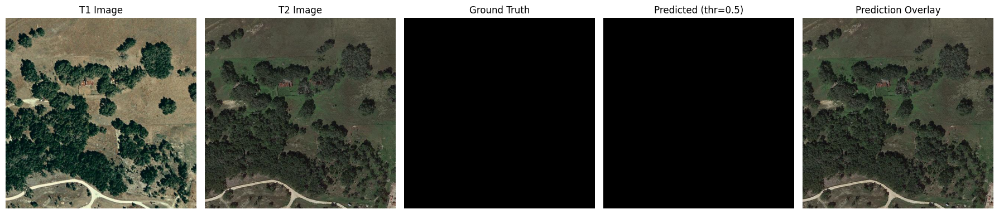

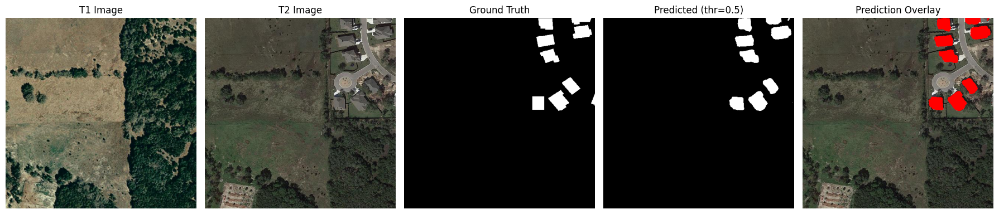

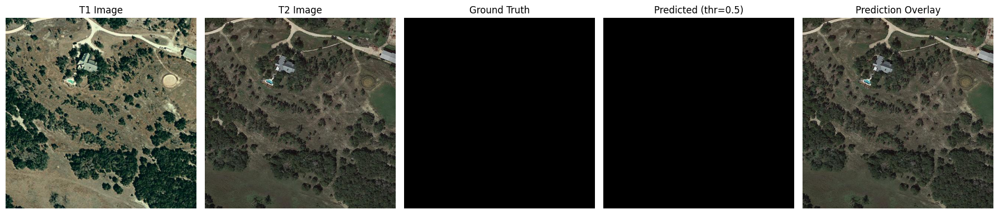

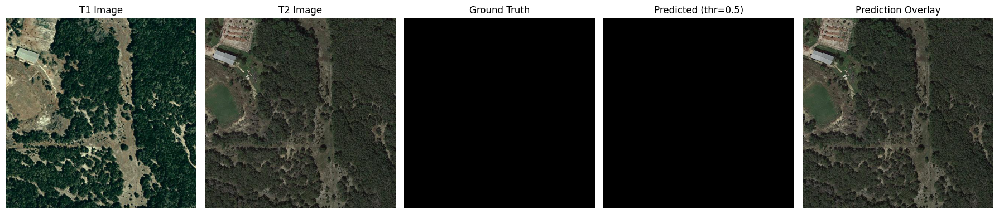

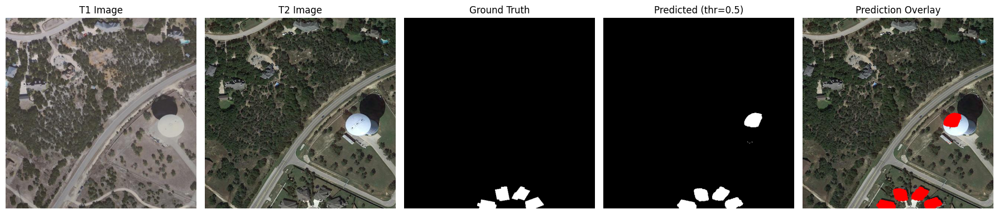

...

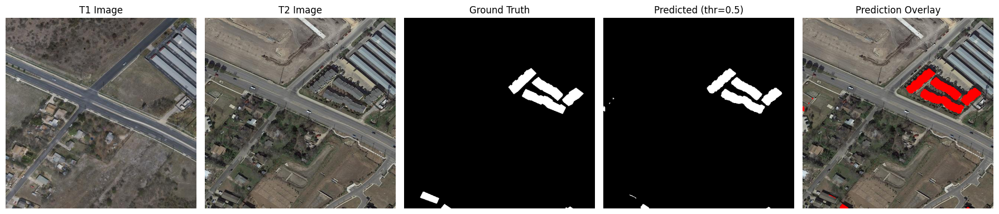

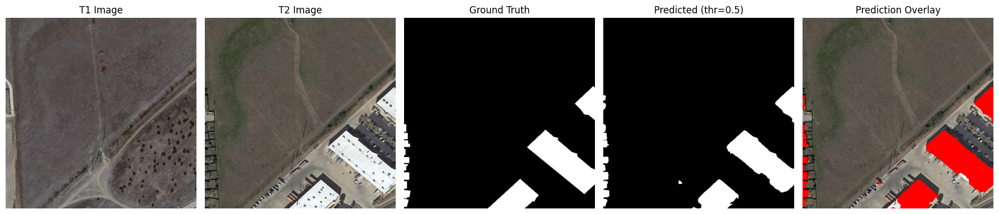

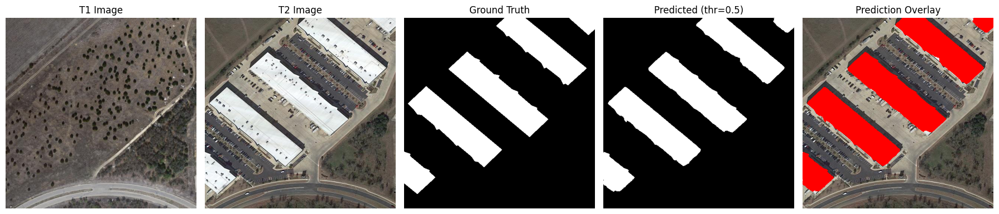

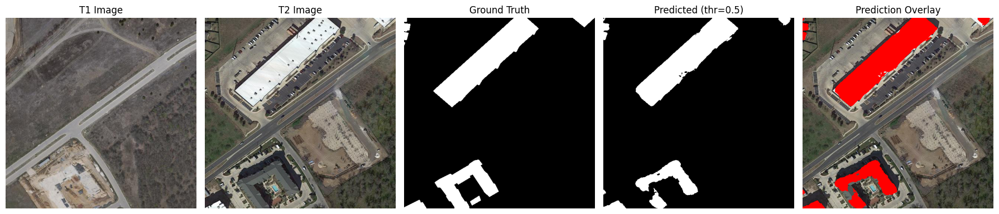

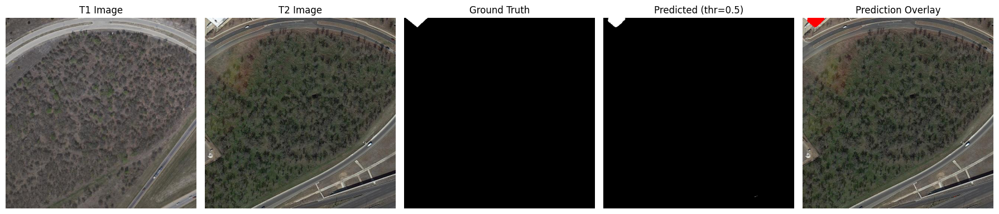

In [ ]:
import matplotlib.pyplot as plt

def visualize_predictions(model, X1, X2, y_true, num_samples=5, threshold=0.5):

    preds = model.predict([X1, X2], verbose=0)
    preds_bin = (preds[..., 1] > threshold).astype(np.uint8) 

    for i in range(num_samples):
        fig, axs = plt.subplots(1, 5, figsize=(18, 6))

        axs[0].imshow(X1[i])
        axs[0].set_title("T1 Image")
        axs[0].axis("off")

        axs[1].imshow(X2[i])
        axs[1].set_title("T2 Image")
        axs[1].axis("off")

        axs[2].imshow(y_true[i, ..., 1], cmap="gray")
        axs[2].set_title("Ground Truth")
        axs[2].axis("off")

        axs[3].imshow(preds_bin[i], cmap="gray")
        axs[3].set_title(f"Predicted (thr={threshold})")
        axs[3].axis("off")

        overlay = X2[i].copy()
        overlay[preds_bin[i] == 1] = [1.0, 0, 0] 
        axs[4].imshow(overlay)
        axs[4].set_title("Prediction Overlay")
        axs[4].axis("off")

        plt.tight_layout()
        plt.show()

visualize_predictions(model, X1_test, X2_test, y_test, num_samples=20, threshold=0.5)
